# Hello, KAN!

### Kolmogorov-Arnold representation theorem

Kolmogorov-Arnold representation theorem states that if $f$ is a multivariate continuous function
on a bounded domain, then it can be written as a finite composition of continuous functions of a
single variable and the binary operation of addition. More specifically, for a smooth $f : [0,1]^n \to \mathbb{R}$,


$$f(x) = f(x_1,...,x_n)=\sum_{q=1}^{2n+1}\Phi_q(\sum_{p=1}^n \phi_{q,p}(x_p))$$

where $\phi_{q,p}:[0,1]\to\mathbb{R}$ and $\Phi_q:\mathbb{R}\to\mathbb{R}$. In a sense, they showed that the only true multivariate function is addition, since every other function can be written using univariate functions and sum. However, this 2-Layer width-$(2n+1)$ Kolmogorov-Arnold representation may not be smooth due to its limited expressive power. We augment its expressive power by generalizing it to arbitrary depths and widths.

### Kolmogorov-Arnold Network (KAN)

The Kolmogorov-Arnold representation can be written in matrix form

$$f(x)={\bf \Phi}_{\rm out}\circ{\bf \Phi}_{\rm in}\circ {\bf x}$$

where 

$${\bf \Phi}_{\rm in}= \begin{pmatrix} \phi_{1,1}(\cdot) & \cdots & \phi_{1,n}(\cdot) \\ \vdots & & \vdots \\ \phi_{2n+1,1}(\cdot) & \cdots & \phi_{2n+1,n}(\cdot) \end{pmatrix},\quad {\bf \Phi}_{\rm out}=\begin{pmatrix} \Phi_1(\cdot) & \cdots & \Phi_{2n+1}(\cdot)\end{pmatrix}$$

We notice that both ${\bf \Phi}_{\rm in}$ and ${\bf \Phi}_{\rm out}$ are special cases of the following function matrix ${\bf \Phi}$ (with $n_{\rm in}$ inputs, and $n_{\rm out}$ outputs), we call a Kolmogorov-Arnold layer:

$${\bf \Phi}= \begin{pmatrix} \phi_{1,1}(\cdot) & \cdots & \phi_{1,n_{\rm in}}(\cdot) \\ \vdots & & \vdots \\ \phi_{n_{\rm out},1}(\cdot) & \cdots & \phi_{n_{\rm out},n_{\rm in}}(\cdot) \end{pmatrix}$$

${\bf \Phi}_{\rm in}$ corresponds to $n_{\rm in}=n, n_{\rm out}=2n+1$, and ${\bf \Phi}_{\rm out}$ corresponds to $n_{\rm in}=2n+1, n_{\rm out}=1$.

After defining the layer, we can construct a Kolmogorov-Arnold network simply by stacking layers! Let's say we have $L$ layers, with the $l^{\rm th}$ layer ${\bf \Phi}_l$ have shape $(n_{l+1}, n_{l})$. Then the whole network is

$${\rm KAN}({\bf x})={\bf \Phi}_{L-1}\circ\cdots \circ{\bf \Phi}_1\circ{\bf \Phi}_0\circ {\bf x}$$

In constrast, a Multi-Layer Perceptron is interleaved by linear layers ${\bf W}_l$ and nonlinearities $\sigma$:

$${\rm MLP}({\bf x})={\bf W}_{L-1}\circ\sigma\circ\cdots\circ {\bf W}_1\circ\sigma\circ {\bf W}_0\circ {\bf x}$$

A KAN can be easily visualized. (1) A KAN is simply stack of KAN layers. (2) Each KAN layer can be visualized as a fully-connected layer, with a 1D function placed on each edge. Let's see an example below.

### Get started with KANs

Initialize KAN

In [484]:
import torch

from kan import *
# create a KAN: 2D inputs, 1D output, and 5 hidden neurons. cubic spline (k=3), 5 grid intervals (grid=5).
model = KAN(width=[2,5,1], grid=3, k=3, grid_eps=0.0, seed=1, grid_range=[-0.5,0.5])

Create dataset

In [485]:
# create dataset f(x,y) = exp(sin(pi*x)+y^2)
# f = lambda x: x[:,[0]]**3 + x[:,[1]]**3
# N = 1000
# N_sqrt = int(N**0.5)
# dataset = create_dataset(f, n_var=2, train_num=N, test_num=N, seed=0)
# dataset['train_input'].shape, dataset['train_label'].shape

In [486]:
mesh_path = "data/bunny_curvs.ply"
dataset = create_dataset_from_mesh(mesh_path=mesh_path,sampled_index=1000, show_sample=True)


In [487]:
dataset['train_input'].shape, dataset['train_label'].shape


(torch.Size([372, 2]), torch.Size([372, 1]))

Plot KAN at initialization

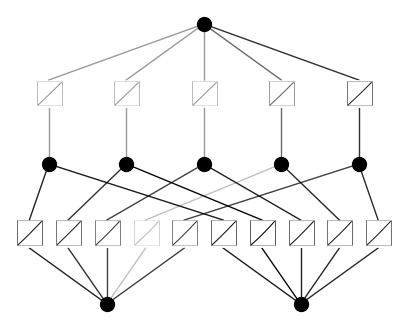

In [488]:
# plot KAN at initialization
model(dataset['train_input'])
model.plot(beta=100)

Train KAN with sparsity regularization

In [489]:
# train the model
model.train(dataset, opt="LBFGS", steps=20, lamb=0.01, lamb_entropy=1.);

train loss: 1.98e-02 | test loss: 2.22e-02 | reg: 1.83e+00 : 100%|██| 20/20 [00:01<00:00, 11.33it/s]


Plot trained KAN

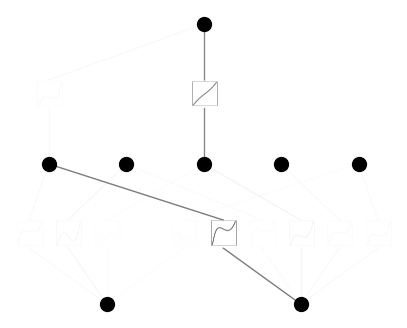

In [490]:
model.plot()

Prune KAN and replot (keep the original shape)

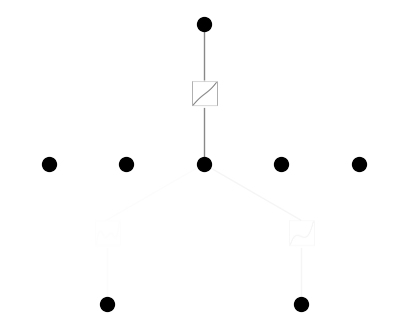

In [491]:
model.prune()
model.plot(mask=True)

Prune KAN and replot (get a smaller shape)

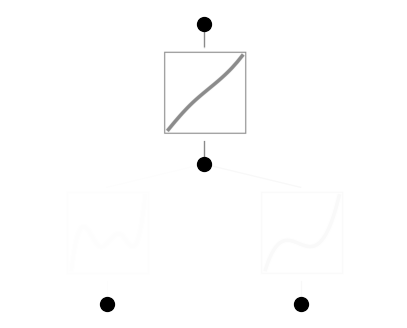

In [492]:
model = model.prune()
model(dataset['train_input'])
model.plot()

Continue training and replot

In [493]:
model.train(dataset, opt="LBFGS", steps=50);

train loss: 2.50e-03 | test loss: 4.54e-03 | reg: 5.76e+00 : 100%|██| 50/50 [00:02<00:00, 23.09it/s]


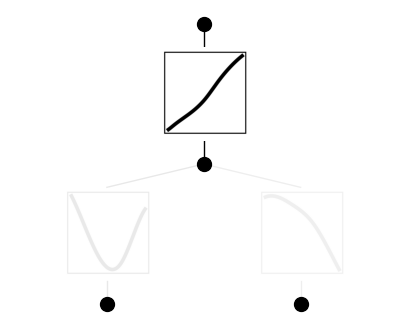

In [494]:
model.plot()

Automatically or manually set activation functions to be symbolic

In [495]:
mode = "auto" # "manual"

if mode == "manual":
    # manual mode
    model.fix_symbolic(0,0,0,'sin');
    model.fix_symbolic(0,1,0,'x^2');
    model.fix_symbolic(1,0,0,'exp');
elif mode == "auto":
    # automatic mode
    # lib = ['x','x^2','x^3','x^4','exp','log','sqrt','tanh','sin','abs']
    lib = ['x','x^2','x^3','x^4','exp','tanh','sin','abs']
    model.auto_symbolic(lib=lib)

fixing (0,0,0) with sin, r2=0.9733471274375916
fixing (0,1,0) with x^3, r2=0.9993565678596497
fixing (1,0,0) with x^4, r2=0.9951468110084534


Continue training to almost machine precision

In [496]:
model.train(dataset, opt="LBFGS", steps=50)

train loss: 3.51e-03 | test loss: 6.30e-03 | reg: 5.49e+00 : 100%|██| 50/50 [00:00<00:00, 76.00it/s]


{'train_loss': [array(0.00353686, dtype=float32),
  array(0.00350966, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.00350837, dtype=float32),
  array(0.0035

Obtain the symbolic formula

In [497]:
print(model.symbolic_formula()[0][0])

848.48*(-(-x_2 - 0.13)**3 - 0.05*sin(10.0*x_1 - 1.59) - 0.16)**4 - 0.1


In [498]:
formula, vars = model.symbolic_formula()
result = formula[0].subs([(vars[0], -1), (vars[1], 0.5)])
print(result)

-0.0948225666349643


In [499]:
x = torch.tensor([[0.0], [0.0]], requires_grad=True).T

print(x.size())



torch.Size([1, 2])


In [500]:
from my_functions import calculate_signature, format_signature

In [501]:
signature = calculate_signature(model, x)

/Users/gal.yona/Documents/MSc/Thesis/ImplicitNeuralSurfaces/pykan/kan/KAN.py:325: UserWarning:

std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/ReduceOps.cpp:1760.)



In [502]:
print(signature)
# print("signature seed 10:"+ format_signature(torch.tensor([-2.0057,  4.0225,  0.0667,  0.0090, -0.2664, -0.0362])))
# print("signature seed 2: "+ format_signature(torch.tensor([-2.0000e+00,  4.0000e+00,  2.7865e-04,  1.4080e-04, -1.1146e-03,-5.6320e-04])))
# print("signature seed 1:"+ format_signature(torch.tensor([-2.0000e+00,  4.0000e+00,  3.3908e-04, -1.3341e-04, -1.3563e-03, 5.3364e-04])))
# print("signature seed 0:"+ format_signature(torch.tensor( [-2.0478,  4.1926, -0.1001, -0.0451,  0.4063,  0.1865])))
print("signature 100 points:" + format_signature(torch.tensor([-2.0683e+00,  4.2724e+00, -2.3339e-01,  3.5228e-04,  9.3744e-01,
         -1.4823e-03])))
print("signature 400 points:" + format_signature(torch.tensor([-2.0000e+00,  3.9999e+00,  1.4704e-03, -1.3829e-04, -5.8815e-03,
          5.5314e-04])))
print("signature 900 points:" + format_signature(torch.tensor([-2.0000e+00,  4.0000e+00, -1.7948e-04,  7.5983e-04,  7.1791e-04,
         -3.0393e-03])))

tensor([[ -7.9832, -48.6702, -11.5180,  21.5804, -70.2551,  26.6485]],
       grad_fn=<StackBackward0>)
signature 100 points:H: -2.0683, K: 4.2724, H_1: -0.2334, H_2: 0.0004, K_1: 0.9374, K_2: -0.0015
signature 400 points:H: -2.0000, K: 3.9999, H_1: 0.0015, H_2: -0.0001, K_1: -0.0059, K_2: 0.0006
signature 900 points:H: -2.0000, K: 4.0000, H_1: -0.0002, H_2: 0.0008, K_1: 0.0007, K_2: -0.0030


In [503]:
print("signature 400 points dataset seed 0:" + format_signature(torch.tensor([-2.0000e+00,  4.0000e+00,  2.1320e-04,  6.5734e-10, -8.5281e-04,
         -2.6294e-09])))
print("signature 400 points dataset seed 2:" + format_signature(torch.tensor([-2.0000e+00,  4.0000e+00,  2.7518e-04,  1.1516e-09, -1.1007e-03,
         -4.6063e-09])))

signature 400 points dataset seed 0:H: -2.0000, K: 4.0000, H_1: 0.0002, H_2: 0.0000, K_1: -0.0009, K_2: -0.0000
signature 400 points dataset seed 2:H: -2.0000, K: 4.0000, H_1: 0.0003, H_2: 0.0000, K_1: -0.0011, K_2: -0.0000


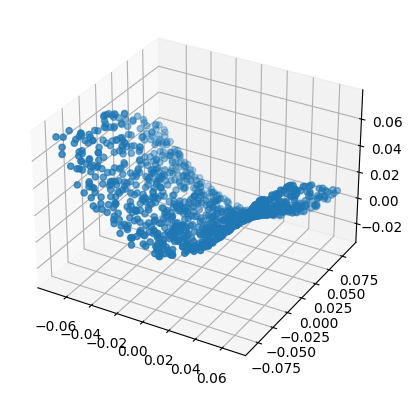

In [504]:
# plot surface
import matplotlib.pyplot as plt

XY = dataset["test_input"] # N x 2
# F = dataset["test_label"]
# X, Y = torch.meshgrid(x, y)
# X = X.reshape(-1, 1)
# Y = Y.reshape(-1, 1)
# XY = torch.cat((X, Y), 1)
F = model(XY)
F = F.reshape(-1, 1)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(XY[:,0].detach().numpy(), XY[:,1].detach().numpy(), F.detach().numpy())
# ax.plot_surface(X.reshape(100, 100).detach().numpy(), Y.reshape(100, 100).detach().numpy(), F.detach().numpy())
plt.show()


In [505]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(x=XY[:,0].detach().numpy(),
                                   y=XY[:,1].detach().numpy(),
                                   z=F.detach().numpy().flatten(),
                                   mode='markers',
                                   marker=dict(size=3, opacity=0.8))])

# fig = go.Figure(data=[go.Surface(x=XY[:,0].reshape(30, 30).detach().numpy(),
#                                  y=XY[:,1].reshape(30, 30).detach().numpy(),
#                                  z=F.detach().numpy())])

fig.update_layout(scene=dict(xaxis_title='x',
                                yaxis_title='y',
                                zaxis_title='f(x, y)'))

fig.show()

In [506]:
go.Scatter3d(x=XY[:,0].detach().numpy(),
                                   y=XY[:,1].detach().numpy(),
                                   z=F.detach().numpy(),
                                   mode='markers',
                                   marker=dict(size=2))

Scatter3d({
    'marker': {'size': 2},
    'mode': 'markers',
    'x': array([-0.03253152,  0.06118762,  0.03658554, ..., -0.04294855, -0.03292406,
                 0.04607272], dtype=float32),
    'y': array([-0.02326823, -0.01316208,  0.03990618, ...,  0.02659815, -0.02693243,
                 0.01690787], dtype=float32),
    'z': array([[0.01770281],
                [0.04165598],
                [0.00204505],
                ...,
                [0.01416038],
                [0.01855295],
                [0.01686184]], dtype=float32)
})

In [507]:
dataset.keys()

dict_keys(['train_input', 'train_label', 'test_input', 'test_label'])